In [7]:
import tensorflow as tf
from tensorflow.keras import models,layers
import matplotlib.pyplot as plt

In [8]:
IMAGE_SIZE=256
BATCH_SIZE =32
CHANNELS=3
EPOCHS=20

In [9]:
dataset=tf.keras.preprocessing.image_dataset_from_directory(
       "PlantVillage",
         shuffle=True,
          image_size= (IMAGE_SIZE,IMAGE_SIZE),
         batch_size= BATCH_SIZE
)

Found 3601 files belonging to 6 classes.


In [10]:
len(dataset)

113

In [11]:
class_names=dataset.class_names
print(class_names)

['Aphids', 'Army worm', 'Bacterial Blight', 'Healthy', 'Powdery Mildew', 'Target spot']


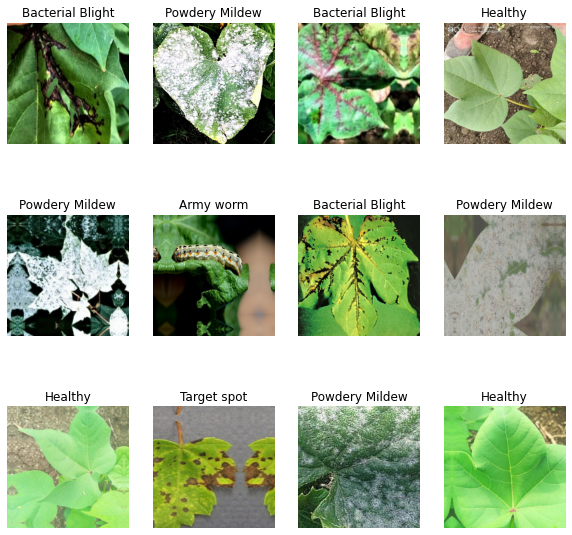

In [13]:
plt.figure(figsize=(10,10))
for image_batch,label_batch in dataset.take(1):
   for i in range(12):
    ax=plt.subplot(3,4,i+1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(class_names[label_batch[i]])
    plt.axis("off")
    

In [14]:
train_size =0.8
len(dataset)*train_size

90.4

In [15]:
train_ds=dataset.take(54)
len(train_ds)

54

In [16]:
test_ds =dataset.skip(54)
len(test_ds)

59

In [17]:
 val_size=0.1##10
len(dataset)*val_size

11.3

In [18]:
val_ds= test_ds.take(6)
len(val_ds)

6

In [19]:
test_ds =test_ds.skip(6)
len(test_ds)

53

In [20]:
def get_dataset_partitions_tf(ds,train_split=0.8,val_split=0.1,test_split=0.1,shuffle=True,shuffle_size=10000):
    ds_size=len(ds)
    if shuffle:
        ds=ds.shuffle(shuffle_size,seed=12)
    train_size=int(train_split *ds_size)
    val_size=int(val_split *ds_size)
    
    train_ds=ds.take(train_size)
    val_ds =ds.skip(train_size).take(val_size)
    test_ds=ds.skip(train_size).skip(val_size)
    return train_ds,val_ds,test_ds

    

In [21]:
train_ds,val_ds,test_ds =get_dataset_partitions_tf(dataset)


In [22]:
len(train_ds)

90

In [23]:
len(val_ds)

11

In [24]:
len(test_ds)

12

In [25]:
train_ds=train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds=val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds=test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [26]:
resize_and_rescale=tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE,IMAGE_SIZE),
    layers.Rescaling(1.0/255)])


In [27]:
data_argumentation=tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
])

In [28]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 6

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

In [29]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (32, 60, 60, 64)         

In [30]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [31]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS
)


Epoch 1/20
90/90 [==============================] - 501s 5s/step - loss: 1.6361 - accuracy: 0.3002 - val_loss: 1.3944 - val_accuracy: 0.4347
Epoch 2/20
90/90 [==============================] - 396s 4s/step - loss: 1.3119 - accuracy: 0.4890 - val_loss: 1.1047 - val_accuracy: 0.5824
Epoch 3/20
90/90 [==============================] - 328s 4s/step - loss: 1.0646 - accuracy: 0.6178 - val_loss: 0.9662 - val_accuracy: 0.6392
Epoch 4/20
90/90 [==============================] - 325s 4s/step - loss: 0.8881 - accuracy: 0.6792 - val_loss: 0.8943 - val_accuracy: 0.7045
Epoch 5/20
90/90 [==============================] - 331s 4s/step - loss: 0.7266 - accuracy: 0.7442 - val_loss: 0.7706 - val_accuracy: 0.7670
Epoch 6/20
90/90 [==============================] - 324s 4s/step - loss: 0.6268 - accuracy: 0.7745 - val_loss: 0.5046 - val_accuracy: 0.8409
Epoch 7/20
90/90 [==============================] - 336s 4s/step - loss: 0.4723 - accuracy: 0.8415 - val_loss: 0.5307 - val_accuracy: 0.8011
Epoch 8/20
90

In [33]:
scores=model.evaluate(test_ds)
print(scores)

12/12 [==============================] - 12s 817ms/step - loss: 0.2764 - accuracy: 0.9141
[0.2764029800891876, 0.9140625]


In [34]:
len(history.history['accuracy'])

20

In [35]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

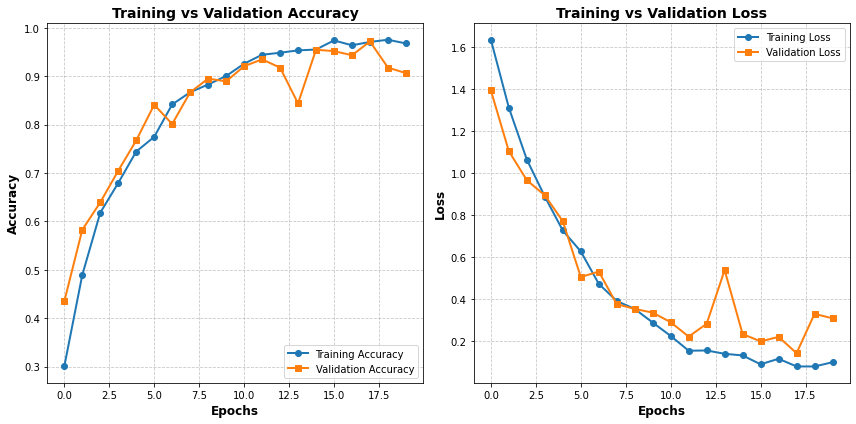

In [36]:
import matplotlib.pyplot as plt

# Assuming acc, val_acc, loss, val_loss, and EPOCHS are defined

plt.figure(figsize=(12, 6))

# Plot for Training and Validation Accuracy with enhanced styling
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, 'o-', label='Training Accuracy', linewidth=2, markersize=6)
plt.plot(range(EPOCHS), val_acc, 's-', label='Validation Accuracy', linewidth=2, markersize=6)
plt.xlabel("Epochs", fontsize=12, fontweight='bold')
plt.ylabel("Accuracy", fontsize=12, fontweight='bold')
plt.title("Training vs Validation Accuracy", fontsize=14, fontweight='bold')
plt.legend(loc='lower right')
plt.grid(True, linestyle='--', alpha=0.7)

# Plot for Training and Validation Loss with enhanced styling
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, 'o-', label='Training Loss', linewidth=2, markersize=6)
plt.plot(range(EPOCHS), val_loss, 's-', label='Validation Loss', linewidth=2, markersize=6)
plt.xlabel("Epochs", fontsize=12, fontweight='bold')
plt.ylabel("Loss", fontsize=12, fontweight='bold')
plt.title("Training vs Validation Loss", fontsize=14, fontweight='bold')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


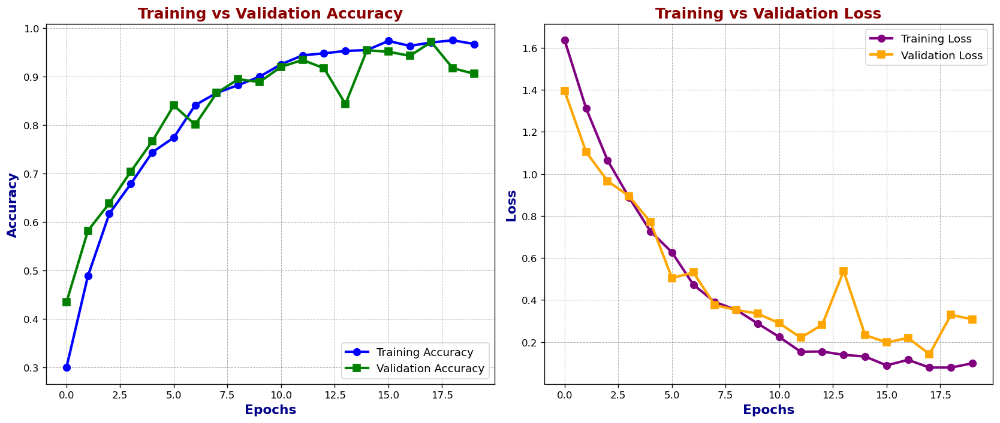

In [37]:
import matplotlib.pyplot as plt

# Enhanced visualization with high resolution and advanced styling
plt.figure(figsize=(14, 6), dpi=120)  # Higher DPI for better resolution

# Plot for Training and Validation Accuracy with advanced styling
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, 'o-', color='blue', label='Training Accuracy', linewidth=2.5, markersize=7)
plt.plot(range(EPOCHS), val_acc, 's-', color='green', label='Validation Accuracy', linewidth=2.5, markersize=7)
plt.xlabel("Epochs", fontsize=13, fontweight='bold', color='darkblue')
plt.ylabel("Accuracy", fontsize=13, fontweight='bold', color='darkblue')
plt.title("Training vs Validation Accuracy", fontsize=15, fontweight='bold', color='darkred')
plt.legend(loc='lower right', fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.6, color='gray', alpha=0.6)

# Plot for Training and Validation Loss with advanced styling
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, 'o-', color='purple', label='Training Loss', linewidth=2.5, markersize=7)
plt.plot(range(EPOCHS), val_loss, 's-', color='orange', label='Validation Loss', linewidth=2.5, markersize=7)
plt.xlabel("Epochs", fontsize=13, fontweight='bold', color='darkblue')
plt.ylabel("Loss", fontsize=13, fontweight='bold', color='darkblue')
plt.title("Training vs Validation Loss", fontsize=15, fontweight='bold', color='darkred')
plt.legend(loc='upper right', fontsize=11)
plt.grid(True, linestyle='--', linewidth=0.6, color='gray', alpha=0.6)

plt.tight_layout()
plt.show()


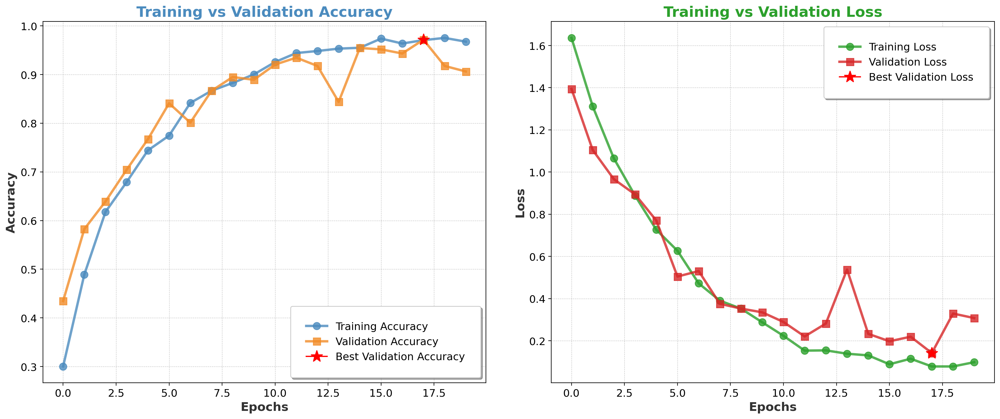

In [39]:
import matplotlib.pyplot as plt

# Ultra-stylized, high-resolution comparison graph with added visual elements
plt.figure(figsize=(18, 8), dpi=200)  # Higher DPI for ultra-clear resolution

# Training and Validation Accuracy with enhanced styling
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, marker='o', color='#4b8bbe', label='Training Accuracy', linewidth=3, markersize=9, alpha=0.8)
plt.plot(range(EPOCHS), val_acc, marker='s', color='#f28c28', label='Validation Accuracy', linewidth=3, markersize=9, alpha=0.8)
plt.xlabel("Epochs", fontsize=15, fontweight='bold', color='#333333')
plt.ylabel("Accuracy", fontsize=15, fontweight='bold', color='#333333')
plt.title("Training vs Validation Accuracy", fontsize=18, fontweight='bold', color='#4b8bbe')
plt.legend(loc='lower right', fontsize=13, fancybox=True, shadow=True, borderpad=1.5)
plt.grid(True, linestyle='--', linewidth=0.5, color='#aaaaaa', alpha=0.7)
plt.tick_params(axis='both', which='major', labelsize=13)

# Highlight best accuracy score
best_epoch = max(range(EPOCHS), key=lambda i: val_acc[i])
plt.plot(best_epoch, val_acc[best_epoch], marker='*', color='red', markersize=15, label="Best Validation Accuracy")
plt.legend(loc='lower right', fontsize=13, fancybox=True, shadow=True, borderpad=1.5)

# Training and Validation Loss with similar styling
plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, marker='o', color='#2ca02c', label='Training Loss', linewidth=3, markersize=9, alpha=0.8)
plt.plot(range(EPOCHS), val_loss, marker='s', color='#d62728', label='Validation Loss', linewidth=3, markersize=9, alpha=0.8)
plt.xlabel("Epochs", fontsize=15, fontweight='bold', color='#333333')
plt.ylabel("Loss", fontsize=15, fontweight='bold', color='#333333')
plt.title("Training vs Validation Loss", fontsize=18, fontweight='bold', color='#2ca02c')
plt.legend(loc='upper right', fontsize=13, fancybox=True, shadow=True, borderpad=1.5)
plt.grid(True, linestyle='--', linewidth=0.5, color='#aaaaaa', alpha=0.7)
plt.tick_params(axis='both', which='major', labelsize=13)

# Highlight lowest validation loss
best_loss_epoch = min(range(EPOCHS), key=lambda i: val_loss[i])
plt.plot(best_loss_epoch, val_loss[best_loss_epoch], marker='*', color='red', markersize=15, label="Best Validation Loss")
plt.legend(loc='upper right', fontsize=13, fancybox=True, shadow=True, borderpad=1.5)

# Optimize layout and display
plt.tight_layout(pad=3.5)
plt.show()


first image to predict
actual label: Army worm
1/1 [==============================] - 4s 4s/step
predicted label: Army worm


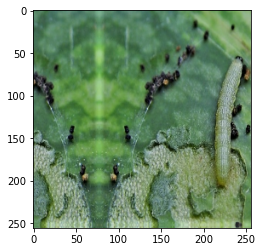

In [40]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

1/1 [==============================] - 0s 66ms/step


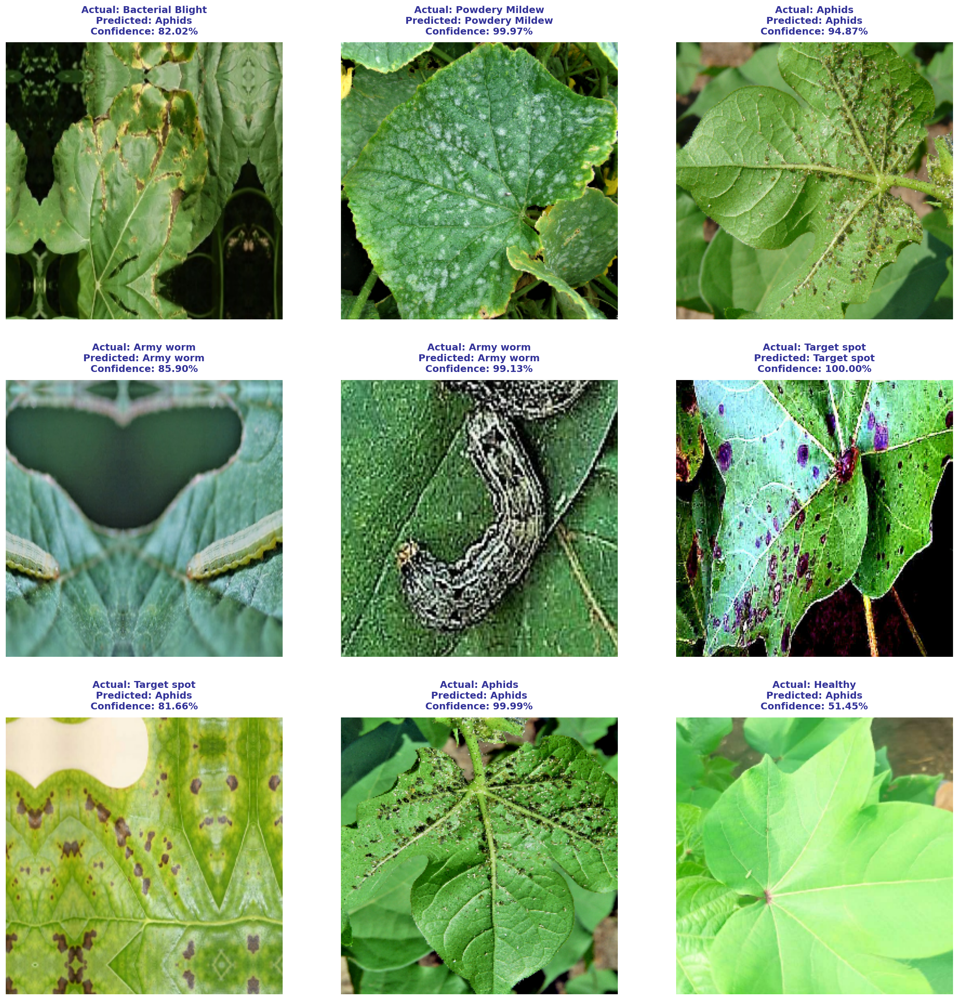

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions
plt.figure(figsize=(18, 18), dpi=150)

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with formatting
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=12, fontweight='bold', color='#333399', pad=10)
        
        plt.axis("off")

plt.tight_layout(pad=3.0)
plt.show()


1/1 [==============================] - 0s 65ms/step


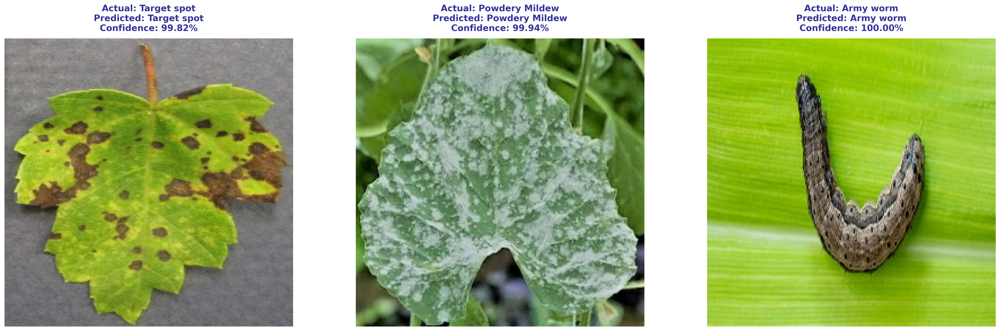

In [43]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with custom formatting
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='#333399', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()


1/1 [==============================] - 0s 52ms/step


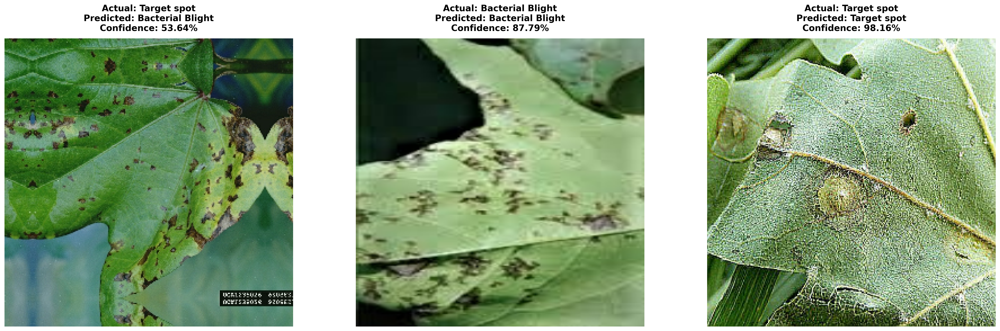

In [44]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with bold black text
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='black', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()


1/1 [==============================] - 0s 50ms/step


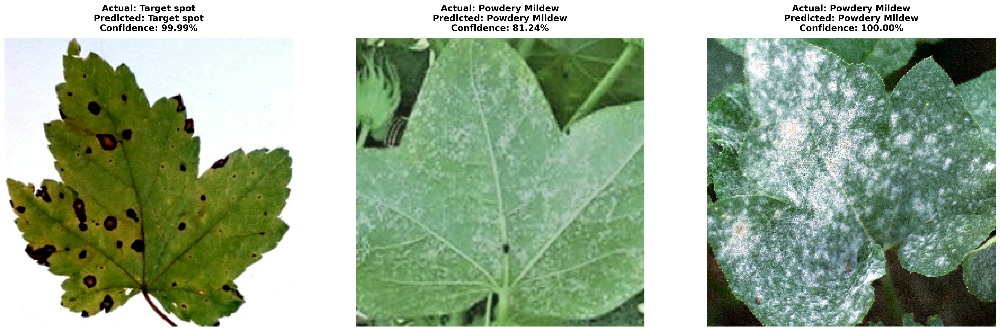

In [45]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with bold black text
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='black', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()


1/1 [==============================] - 0s 49ms/step


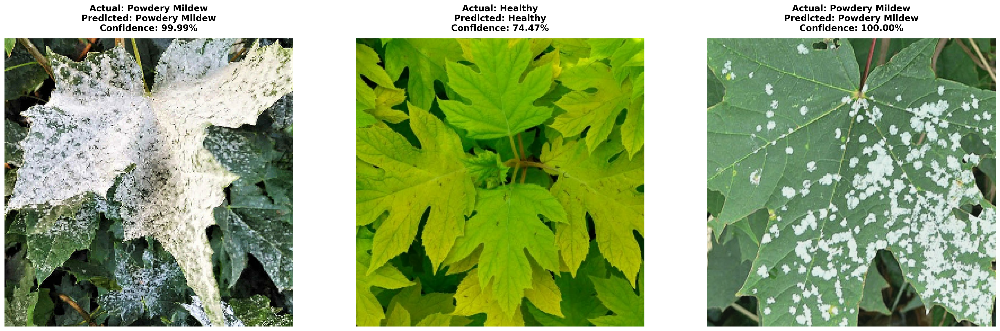

In [46]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with bold black text
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='black', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()


1/1 [==============================] - 0s 48ms/step


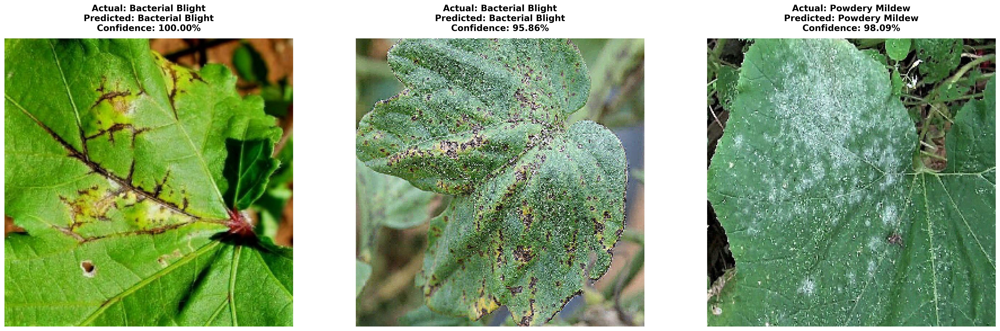

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with bold black text
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='black', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()


1/1 [==============================] - 0s 49ms/step


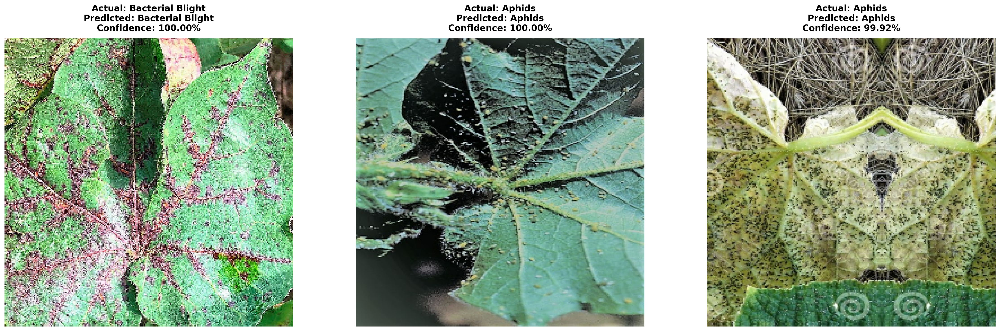

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with bold black text
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='black', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()


1/1 [==============================] - 0s 48ms/step


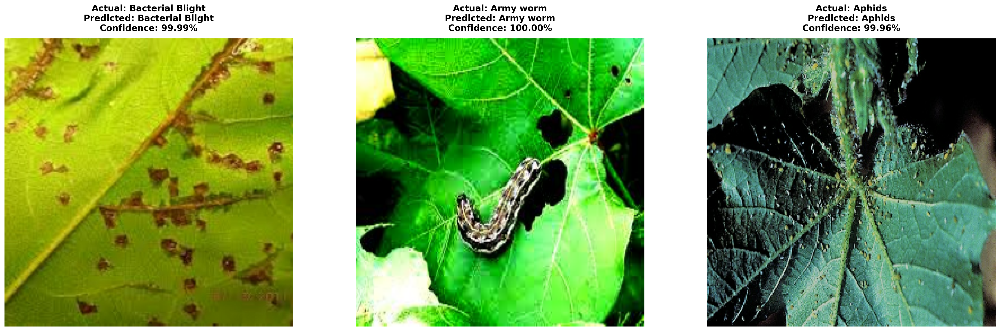

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Define the predict function
def predict(model, image):
    # Expand dimensions to match model input shape and get predictions
    image_batch = np.expand_dims(image, axis=0)
    predictions = model.predict(image_batch)
    confidence = np.max(predictions) * 100  # Get max confidence as a percentage
    predicted_class = class_names[np.argmax(predictions)]
    
    return predicted_class, confidence

# High-resolution visualization for predictions with only 3 images in a row
plt.figure(figsize=(24, 8), dpi=200)  # Higher resolution for better clarity

for images, labels in test_ds.take(1):
    for i in range(3):  # Display only 3 images
        ax = plt.subplot(1, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Use the predict function
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        # Display the title with bold black text
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%",
                  fontsize=14, fontweight='bold', color='black', pad=12)
        
        plt.axis("off")

plt.tight_layout(pad=4.0)
plt.show()
